# Football AI

---

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/roboflow/sports)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/camera-calibration-sports-computer-vision/)
[![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://www.youtube.com/watch?v=aBVGKoNZQUw)

Let's build a Football AI system to dig deeper into match stats! We'll use computer vision and machine learning to track players, determine which team is which, and even calculate stuff like ball possession and speed. This tutorial is perfect if you want to get hands-on with sports analytics and see how AI can take your football analysis to the next level.

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-diagram.png)

## Before you start

### Configure your API keys

- Open your [`HuggingFace Settings`](https://huggingface.co/settings) page. Click `Access Tokens` then `New Token` to generate new token.
- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store HuggingFace Access Token under the name `HF_TOKEN`.
    - Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

### Select the runtime

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [2]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


## Install dependencjes

**Note:** Let's install the `inference-gpu` library, which will be used to efficiently run our object detection and keypoint detection models on GPUs. `inference-gpu` utilizes the `onnxruntime-gpu` library internally for optimal performance. We'll install a specific version of `onnxruntime-gpu` to guarantee compatibility with the CUDA 12 environment in Google Colab.

In [1]:
!pip install -q gdown inference-gpu
!pip install -q onnxruntime-gpu==1.18.0 --index-url https://aiinfra.pkgs.visualstudio.com/PublicPackages/_packaging/onnxruntime-cuda-12/pypi/simple/

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pymc 5.21.1 requires rich>=13.7.1, but you have rich 13.0.1 which is incompatible.


**Note:** Let's install the sports repository directly from GitHub. The sports repository contains a variety of football-related utilities that we'll use along the way.

In [3]:
!pip install -q git+https://github.com/roboflow/sports.git

  Preparing metadata (setup.py) ... done


**Note:** Let's make sure we have the latest features in the supervision library by installing version `0.23.0` or higher.

In [4]:
!pip uninstall -y supervision && pip install -q supervision>=0.23.0

Found existing installation: supervision 0.25.1
Uninstalling supervision-0.25.1:
  Successfully uninstalled supervision-0.25.1


**Note:** Let's download a few sample videos from the [DFL - Bundesliga Data Shootout](https://www.kaggle.com/competitions/dfl-bundesliga-data-shootout) Kaggle competition using gdown.



In [5]:
!gdown -O "jsk.mp4" "https://drive.google.com/uc?id=1ximzhM--cjqYb3IH1oZ973cM_FGnz1Bx"


Downloading...
From: https://drive.google.com/uc?id=1ximzhM--cjqYb3IH1oZ973cM_FGnz1Bx
To: /content/jsk.mp4
100% 29.4M/29.4M [00:00<00:00, 132MB/s]


In [6]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

In [7]:
!pip uninstall -y numpy inference onnxruntime
!pip install numpy==1.23.5
!pip install inference roboflow

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
  Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.3 kB)
Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
onnxruntime-gpu 1.18.0 requires numpy>=1.24.2, but you have numpy 1.23.5 which is incompatible.
albumentations 2.0.5 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
xarray 2025.1.2 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.23.5 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.23.5

  Using cached inference-0.43.0-py3-none-any.whl.metadata (24 kB)
  Using cached roboflow-1.1.58-py3-none-any.whl.metadata (9.7 kB)
  Using cached onnxruntime-1.19.2-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (4.5 kB)
  Using cached idna-3.7-py3-none-any.whl.metadata (9.9 kB)
  Using cached opencv_python_headless-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached pillow_heif-0.22.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.6 kB)
  Using cached filetype-1.2.0-py2.py3-none-any.whl.metadata (6.5 kB)
Using cached inference-0.43.0-py3-none-any.whl (1.0 MB)
Using cached roboflow-1.1.58-py3-none-any.whl (84 kB)
Using cached idna-3.7-py3-none-any.whl (66 kB)
Using cached opencv_python_headless-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (49.9 MB)
Using cached onnxruntime-1.19.2-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (13.2 MB)
   ━━━━━━━━━━━━━━━━━━━━

## ball, player, goalkeeper and referee detection

In [8]:
from inference import get_model
from google.colab import userdata
ROBOFLOW_API_KEY = "nBE2v8IhHUWbOiNTqxqE"
PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc/11"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

ModelDependencyMissing: Your `inference` configuration does not support PaliGemma model. Use pip install 'inference[transformers]' to install missing requirements.
ModelDependencyMissing: Your `inference` configuration does not support Florence2 model. Use pip install 'inference[transformers]' to install missing requirements.
ModelDependencyMissing: Your `inference` configuration does not support Qwen2.5-VL model. Use pip install 'inference[transformers]' to install missing requirements.
ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[sam]' to install missing requirements.
ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[sam]' to install missing requirements.
ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[clip]' to install missing requirements.
ModelDependencyMissing: Your `inference` configuration does

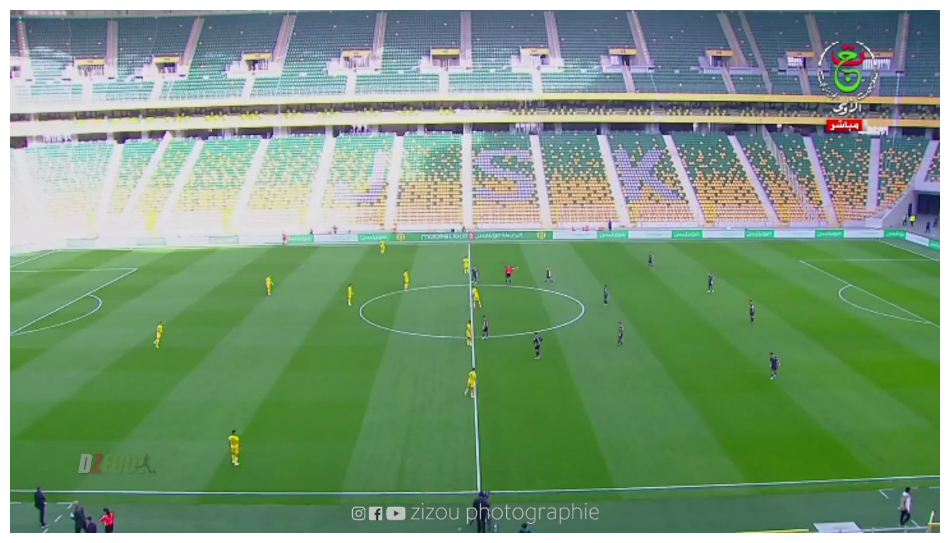

In [9]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

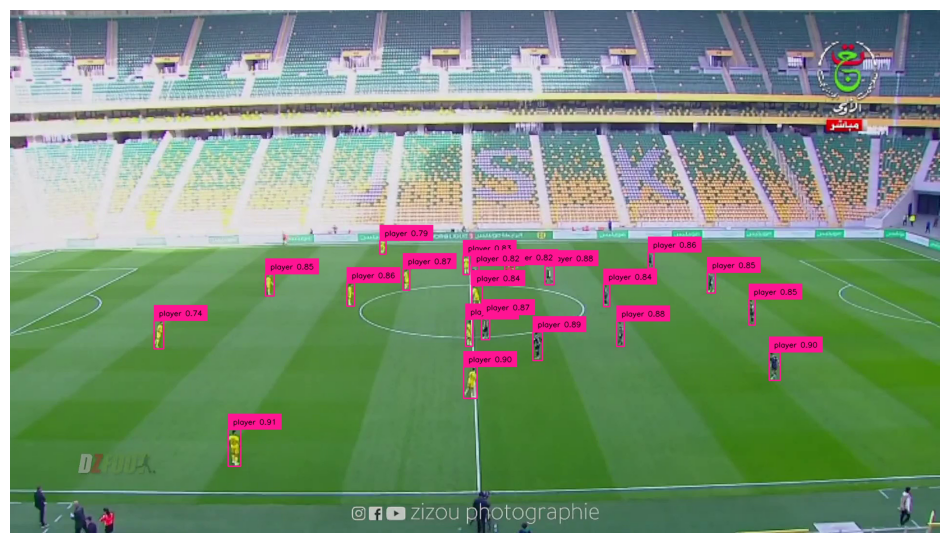

In [11]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.6)[0]
detections = sv.Detections.from_inference(result)

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)

## video game style visualization

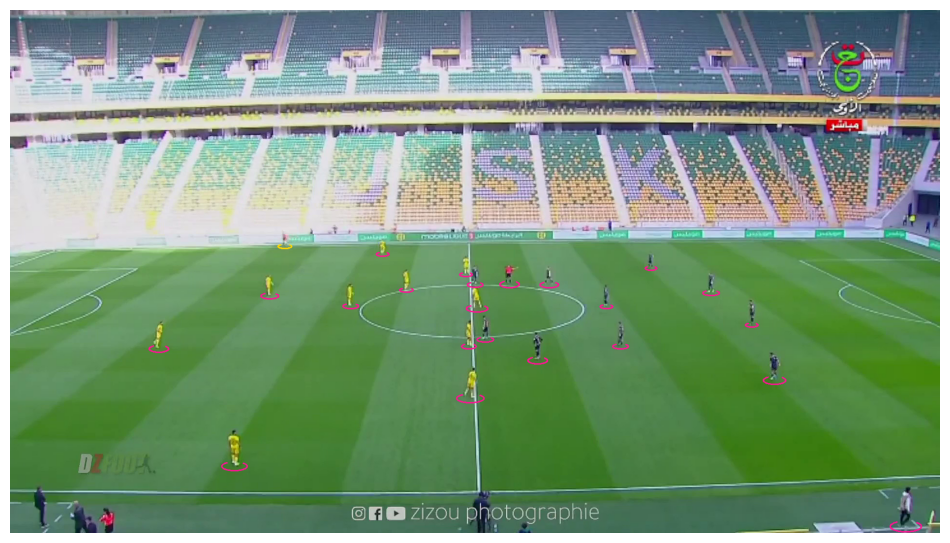

In [14]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

## player tracking

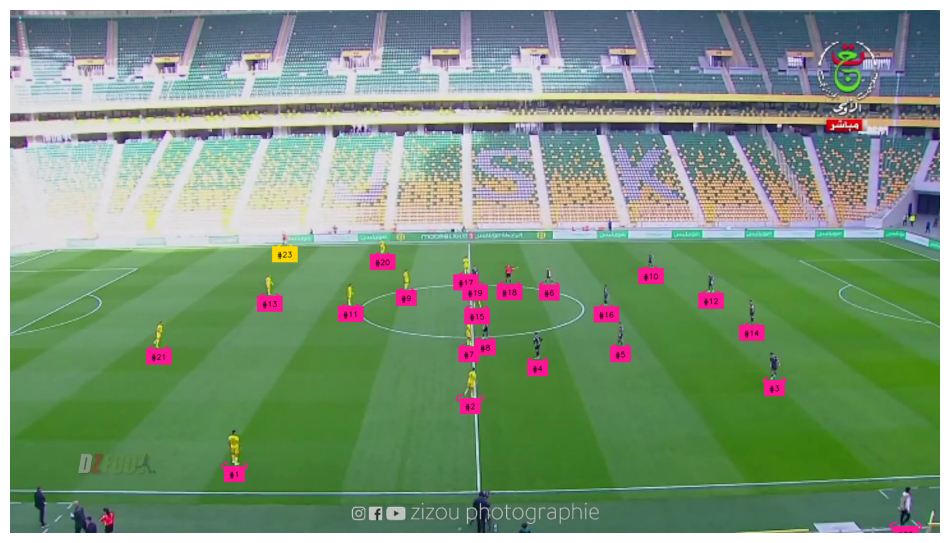

In [15]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

## split players into teams

![football AI diagram](https://media.roboflow.com/notebooks/examples/football-ai-team-clustering.png)

**Note:** Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

In [16]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 8it [02:40, 20.03s/it]


**Note:** Here's a sample (100 elements) of the crops we've gathered.

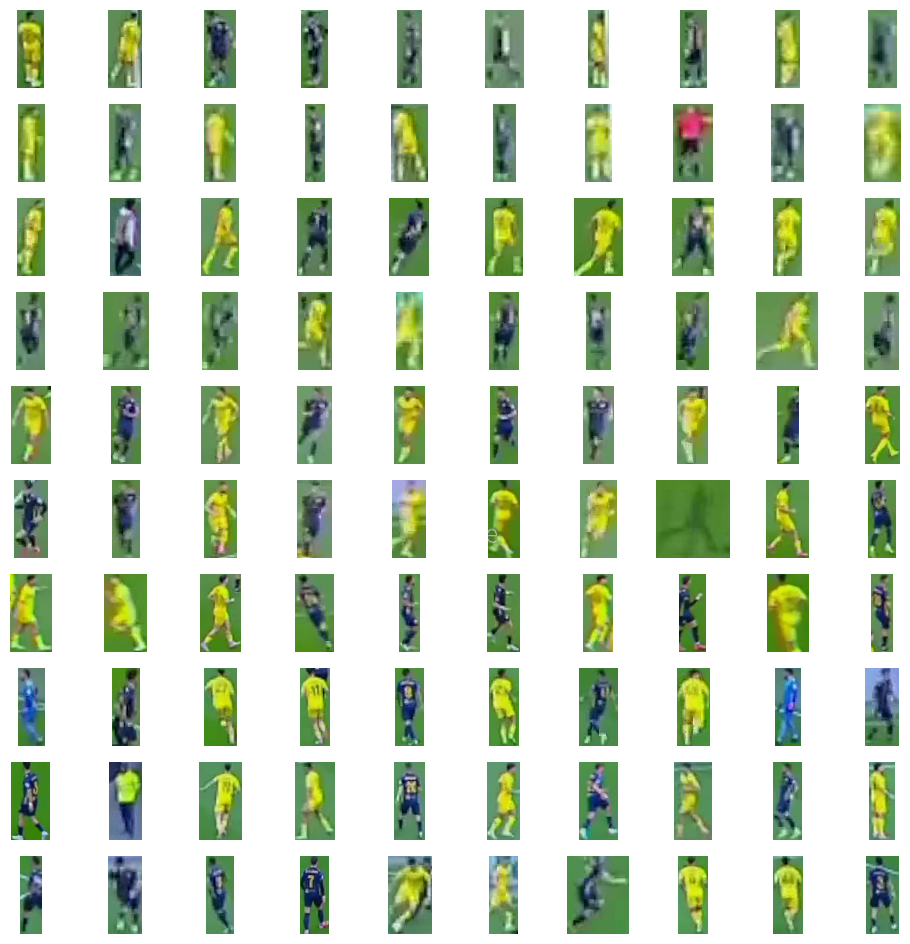

In [17]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

In [22]:
!pip install numpy>=1.20.0

In [24]:
!pip install transformers==4.27.0  # or another compatible version

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 37.7 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.21.1
    Uninstalling tokenizers-0.21.1:
      Successfully uninstalled tokenizers-0.21.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.49.0
    Uninstalling transformers-4.49.0:
      Successfully uninstalled transformers-4.49.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 0.43.0 requires numpy<=1.26.4, but you have numpy 2.2.4 which is incompatible.
inference 0.43.0 requires tokenizers<0.22.0,>=0.19.0, but you have tokenizers 0.13.3 which is incompatible.
inference-gpu 0.43.0 requires numpy<=1.26.

**Note:** Next, we'll run [SigLIP](https://huggingface.co/docs/transformers/en/model_doc/siglip) to calculate embeddings for each of the crops.

In [25]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

RuntimeError: Failed to import transformers.models.siglip.modeling_siglip because of the following error (look up to see its traceback):
No module named 'transformers.models.siglip.modeling_siglip'

In [19]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 0it [00:00, ?it/s]


NameError: name 'EMBEDDINGS_PROCESSOR' is not defined

**Note:** Using [UMAP](https://github.com/lmcinnes/umap), we project our embeddings from `(N, 768)` to `(N, 3)` and then perform a two-cluster division using [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

In [ ]:
import umap
from sklearn.cluster import KMeans

REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

In [ ]:
projections = REDUCER.fit_transform(data)
clusters = CLUSTERING_MODEL.fit_predict(projections)

**Note:** Here's an interactive visualization of our results. Click on a dot to display its associated crop.


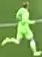
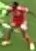
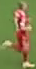
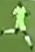
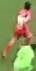
...
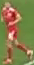
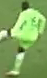
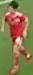
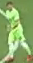
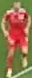

In [ ]:
import plotly.graph_objects as go
import numpy as np
from typing import Dict, List
from IPython.core.display import display, HTML
from PIL import Image
import base64
from io import BytesIO


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    display(HTML(html_template))

display_projections(clusters, projections, crops)

**Note:** To simplify the use of the SigLIP, UMAP, and KMeans combo, I've packaged all these models into a [`TeamClassifier`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/team.py#L41) that you can find in the [sports](https://github.com/roboflow/sports) repository.

In [ ]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cuda")
team_classifier.fit(crops)

collecting crops: 25it [00:03,  6.77it/s]
Embedding extraction: 18it [00:04,  4.40it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



**Note:** Time to assign goalkeepers to teams. We'll use a simple heuristic: calculate the average position (centroid) of the players belonging to both teams and then assign the goalkeeper to the team whose average position is closer.

In [ ]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

Embedding extraction: 1it [00:00,  7.22it/s]


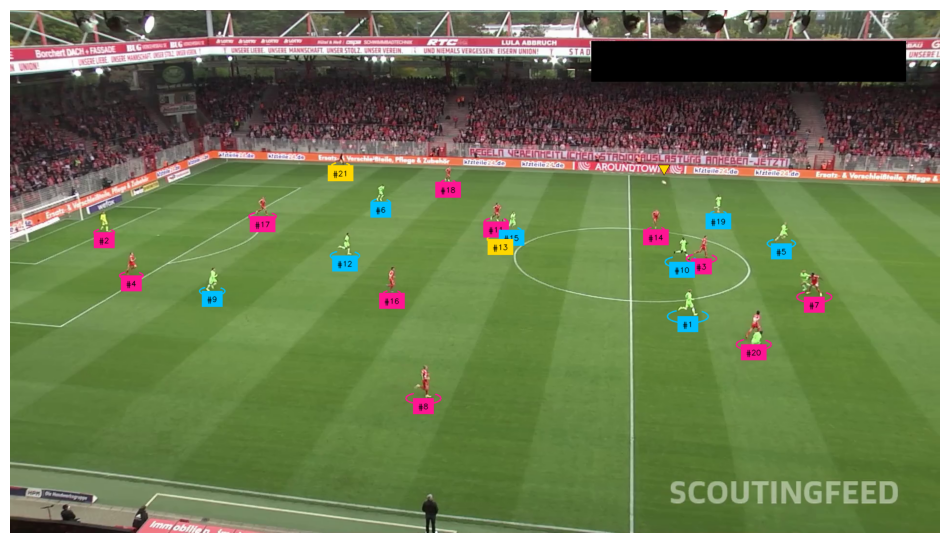

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

## pitch keypoint detection

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

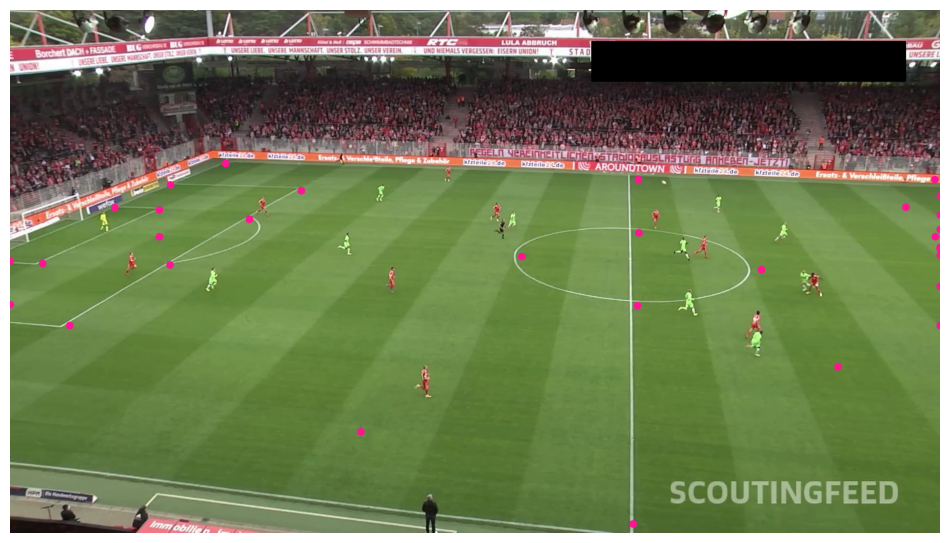

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

**Note:** Notice that some of the keypoints we detected are in incorrect locations. These are keypoints with a low confidence level. Let's filter out these keypoints and keep only the ones the model is confident about.

## filter low confidence keypoints

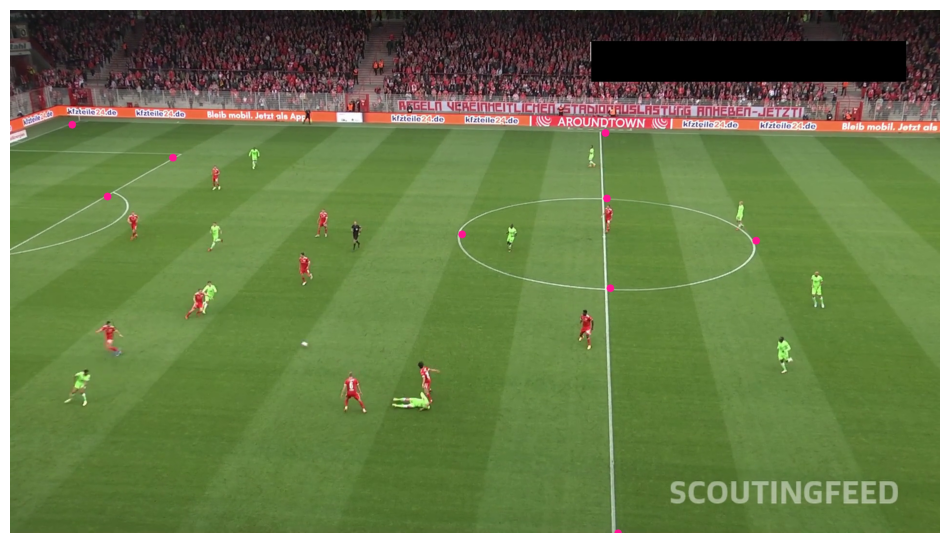

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/jsk.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project pitch lines on frame

**Note:** The [sports](https://github.com/roboflow/sports) repository contains a [`SoccerPitchConfiguration`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/configs/soccer.py#L6) that provides information about the real-world geometry of the soccer pitch. It also includes utilities for visualizing elements located on the pitch.

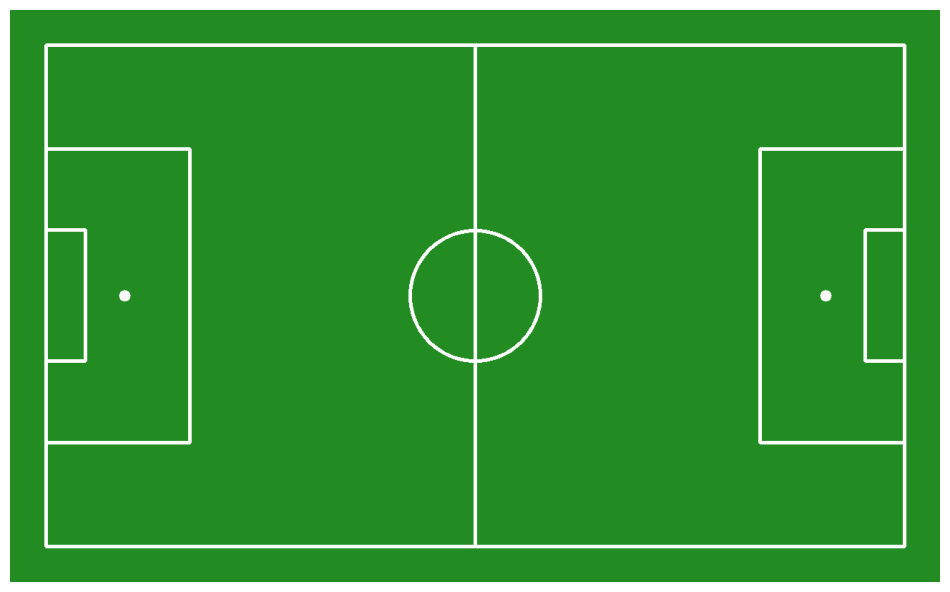

In [ ]:
from sports.annotators.soccer import draw_pitch
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

**Note:** It's time to utilize the keypoint pairs located on the camera perspective plane and the football pitch plane. The [sports](https://github.com/roboflow/sports) repository includes a [`ViewTransformer`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/view.py#L7), which employs homography for perspective transformation.

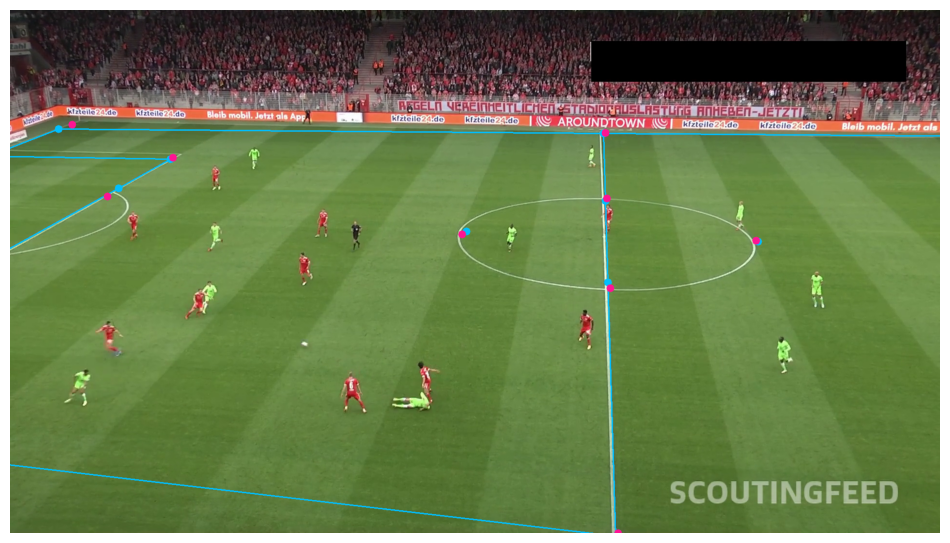

In [ ]:
import numpy as np
import supervision as sv
from sports.common.view import ViewTransformer

SOURCE_VIDEO_PATH = "/content/jsk.mp4"

edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, edges=CONFIG.edges)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project ball, players and referies on pitch

In [ ]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cuda")
team_classifier.fit(crops)

collecting crops: 25it [00:03,  6.89it/s]
Embedding extraction: 18it [00:04,  4.39it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
import cv2
from typing import Optional

def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,
    team_2_xy: np.ndarray,
    team_1_color: sv.Color = sv.Color.RED,
    team_2_color: sv.Color = sv.Color.WHITE,
    opacity: float = 0.5,
    padding: int = 50,
    scale: float = 0.1,
    pitch: Optional[np.ndarray] = None
) -> np.ndarray:
    """
    Draws a Voronoi diagram on a soccer pitch representing the control areas of two
    teams with smooth color transitions.

    Args:
        config (SoccerPitchConfiguration): Configuration object containing the
            dimensions and layout of the pitch.
        team_1_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 1.
        team_2_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 2.
        team_1_color (sv.Color, optional): Color representing the control area of
            team 1. Defaults to sv.Color.RED.
        team_2_color (sv.Color, optional): Color representing the control area of
            team 2. Defaults to sv.Color.WHITE.
        opacity (float, optional): Opacity of the Voronoi diagram overlay.
            Defaults to 0.5.
        padding (int, optional): Padding around the pitch in pixels.
            Defaults to 50.
        scale (float, optional): Scaling factor for the pitch dimensions.
            Defaults to 0.1.
        pitch (Optional[np.ndarray], optional): Existing pitch image to draw the
            Voronoi diagram on. If None, a new pitch will be created. Defaults to None.

    Returns:
        np.ndarray: Image of the soccer pitch with the Voronoi diagram overlay.
    """
    if pitch is None:
        pitch = draw_pitch(
            config=config,
            padding=padding,
            scale=scale
        )

    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    y_coordinates, x_coordinates = np.indices((
        scaled_width + 2 * padding,
        scaled_length + 2 * padding
    ))

    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                       (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)

    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    # Increase steepness of the blend effect
    steepness = 15  # Increased steepness for sharper transition
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    # Create the smooth color transition
    for c in range(3):  # Iterate over the B, G, R channels
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] +
                            (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

In [ ]:
import supervision as sv
import cv2
import numpy as np
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML
import matplotlib.pyplot as plt
from typing import Dict, List, Optional

class PlayerDetectionCorrector:
    def __init__(self, model, source_video_path, confidence_threshold=0.3):
        self.model = model
        self.source_video_path = source_video_path
        self.confidence_threshold = confidence_threshold

        # Set up tracker
        self.tracker = sv.ByteTrack()

        # Set up annotators with improved settings for readability
        self.box_annotator = sv.BoxAnnotator(
            color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
            thickness=2
        )
        # Create a more readable label annotator with adjusted position
        self.label_annotator = sv.LabelAnnotator(
            color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
            text_color=sv.Color.from_hex('#000000'),
            text_scale=0.5,
            text_thickness=1,
            text_padding=3,
            text_position=sv.Position.TOP_LEFT  # Position labels at top-left to reduce overlap
        )

        # Manual corrections storage
        self.corrections = {}  # track_id -> corrected class

        # Player names dictionary
        self.player_names = {}  # track_id -> player name

        # Set up video frame generator
        self.video_frames = sv.get_video_frames_generator(source_video_path)
        self.current_frame = None
        self.current_detections = None
        self.tracked_detections = None

        # Class options for corrections
        self.class_options = ["player", "referee", "goalkeeper", "ignore"]

        # UI components
        self.output = widgets.Output()
        self.frame_slider = None
        self.correction_widgets = None
        self.name_widgets = None
        self.correction_output = widgets.Output()
        self.process_button = widgets.Button(description="Process Video")
        self.process_button.on_click(self.process_video)

    def get_frame(self, index=0):
        """Get a specific frame from the video"""
        cap = cv2.VideoCapture(self.source_video_path)
        cap.set(cv2.CAP_PROP_POS_FRAMES, index)
        ret, frame = cap.read()
        cap.release()
        if ret:
            return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        return None

    def get_total_frames(self):
        """Get total number of frames in the video"""
        cap = cv2.VideoCapture(self.source_video_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.release()
        return total_frames

    def detect_and_track(self, frame):
        """Run detection and tracking on a frame"""
        # Run inference
        result = self.model.infer(frame, confidence=self.confidence_threshold)[0]
        detections = sv.Detections.from_inference(result)

        # Apply tracker
        tracked_detections = self.tracker.update_with_detections(detections=detections)

        # Apply any manual corrections
        if len(tracked_detections) > 0:
            # Check what attributes are available
            has_track_id = hasattr(tracked_detections, 'tracker_id') or 'tracker_id' in tracked_detections.data
            has_class_name = hasattr(tracked_detections, 'class_name') or 'class_name' in tracked_detections.data

            # Get class names and track IDs based on available attributes
            if has_class_name:
                if hasattr(tracked_detections, 'class_name'):
                    class_names = list(tracked_detections.class_name)
                else:
                    class_names = list(tracked_detections.data['class_name'])
            else:
                # Fallback - look for class_id
                if hasattr(tracked_detections, 'class_id'):
                    class_names = list(tracked_detections.class_id)
                else:
                    class_names = list(tracked_detections.data['class_id']) if 'class_id' in tracked_detections.data else []

            if has_track_id:
                if hasattr(tracked_detections, 'tracker_id'):
                    track_ids = tracked_detections.tracker_id
                else:
                    track_ids = tracked_detections.data['tracker_id']

                # Apply corrections
                for i, track_id in enumerate(track_ids):
                    if track_id in self.corrections:
                        if self.corrections[track_id] == "ignore":
                            # Mark for removal
                            class_names[i] = "ignore"
                        else:
                            class_names[i] = self.corrections[track_id]

                # Remove ignored detections
                mask = [class_name != "ignore" for class_name in class_names]
                tracked_detections = tracked_detections[mask]

                # Update class names without "ignore" entries
                if len(tracked_detections) > 0:
                    filtered_class_names = [c for c in class_names if c != "ignore"]
                    if hasattr(tracked_detections, 'class_name'):
                        tracked_detections.class_name = filtered_class_names
                    elif 'class_name' in tracked_detections.data:
                        tracked_detections.data['class_name'] = filtered_class_names

        return tracked_detections

    def annotate_frame(self, frame, detections):
        """Annotate a frame with detections and player names"""
        if len(detections) == 0:
            return frame.copy()

        # Check what attributes are available
        has_track_id = hasattr(detections, 'tracker_id') or 'tracker_id' in detections.data
        has_class_name = hasattr(detections, 'class_name') or 'class_name' in detections.data
        has_confidence = hasattr(detections, 'confidence') or 'confidence' in detections.data

        # Get correct data
        if has_class_name:
            if hasattr(detections, 'class_name'):
                class_names = detections.class_name
            else:
                class_names = detections.data['class_name']
        else:
            class_names = ["unknown"] * len(detections)

        if has_confidence:
            if hasattr(detections, 'confidence'):
                confidences = detections.confidence
            else:
                confidences = detections.data['confidence']
        else:
            confidences = [0.0] * len(detections)

        if has_track_id:
            if hasattr(detections, 'tracker_id'):
                track_ids = detections.tracker_id
            else:
                track_ids = detections.data['tracker_id']
        else:
            track_ids = list(range(len(detections)))

        # Create labels with player names if available
        labels = []
        for class_name, confidence, track_id in zip(class_names, confidences, track_ids):
            player_name = self.player_names.get(track_id, "")
            if player_name:
                label = f"{player_name} ({class_name}) ID:{track_id}"
            else:
                label = f"{class_name} {confidence:.2f} ID:{track_id}"
            labels.append(label)

        # Copy frame to avoid modifying original
        annotated_frame = frame.copy()

        # Draw ID labels with better spacing
        boxes = detections.xyxy

        # Annotate boxes first
        annotated_frame = self.box_annotator.annotate(
            scene=annotated_frame,
            detections=detections)

        # Draw improved labels with minimal overlap
        # We'll manually space out the labels vertically
        sorted_indices = sorted(range(len(boxes)), key=lambda i: (boxes[i][1], boxes[i][0]))  # Sort by y, then x

        for i in sorted_indices:
            x1, y1, x2, y2 = boxes[i]

            # Get color based on class
            color_idx = i % len(self.box_annotator.color.colors)
            color = self.box_annotator.color.colors[color_idx]

            # Calculate better label position
            label_x = int(x1)
            label_y = max(0, int(y1) - 10)  # Position above box

            # Draw label with a background rectangle for readability
            label_text = labels[i]
            text_size = cv2.getTextSize(
                label_text,
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                1
            )[0]

            # Background rectangle
            cv2.rectangle(
                annotated_frame,
                (label_x, label_y - text_size[1] - 5),
                (label_x + text_size[0] + 5, label_y + 5),
                color.as_bgr(),
                -1
            )

            # Text
            cv2.putText(
                annotated_frame,
                label_text,
                (label_x, label_y),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                (0, 0, 0),
                1
            )

        return annotated_frame

    def apply_correction(self, track_id, new_class):
        """Apply a manual correction to a tracked object"""
        self.corrections[track_id] = new_class

    def apply_player_name(self, track_id, name):
        """Apply a name to a player ID"""
        if name.strip():  # Only save non-empty names
            self.player_names[track_id] = name
        elif track_id in self.player_names:
            # Remove name if input is empty
            del self.player_names[track_id]

    def on_frame_change(self, change):
        """Handle frame slider change"""
        if change['name'] == 'value':
            with self.output:
                clear_output(wait=True)
                self.current_frame = self.get_frame(change['new'])
                if self.current_frame is not None:
                    self.update_detection_display()

    def create_correction_ui(self):
        """Create UI for corrections and player naming"""
        if self.tracked_detections is None or len(self.tracked_detections) == 0:
            self.correction_widgets = widgets.HTML("No detections to correct")
            self.name_widgets = widgets.HTML("")
            return

        correction_uis = []
        name_uis = []

        # Check what attributes are available
        has_track_id = hasattr(self.tracked_detections, 'tracker_id') or 'tracker_id' in self.tracked_detections.data
        has_class_name = hasattr(self.tracked_detections, 'class_name') or 'class_name' in self.tracked_detections.data

        # Get class names and track IDs based on available attributes
        if has_class_name:
            if hasattr(self.tracked_detections, 'class_name'):
                class_names = self.tracked_detections.class_name
            else:
                class_names = self.tracked_detections.data['class_name']
        else:
            class_names = ["unknown"] * len(self.tracked_detections)

        if has_track_id:
            if hasattr(self.tracked_detections, 'tracker_id'):
                track_ids = self.tracked_detections.tracker_id
            else:
                track_ids = self.tracked_detections.data['tracker_id']
        else:
            track_ids = list(range(len(self.tracked_detections)))

        # Create correction UI
        for i, (track_id, class_name) in enumerate(zip(track_ids, class_names)):
            # Create dropdown for class selection
            dropdown = widgets.Dropdown(
                options=self.class_options,
                value=class_name if class_name in self.class_options else self.class_options[0],
                description=f"ID {track_id}:",
                style={'description_width': 'initial'}
            )

            # Remember current values
            current_correction = self.corrections.get(track_id, class_name)
            if current_correction in self.class_options:
                dropdown.value = current_correction

            # Create button to apply correction
            button = widgets.Button(description="Apply")
            button.tracker_id = track_id  # Store tracker_id with the button
            button.dropdown = dropdown  # Store reference to associated dropdown

            button.on_click(self.on_correction_button_click)

            # Group dropdown and button
            ui_group = widgets.HBox([dropdown, button])
            correction_uis.append(ui_group)

            # Create player name text input
            name_input = widgets.Text(
                value=self.player_names.get(track_id, ""),
                placeholder=f"Player name for ID {track_id}",
                description=f"Name ID {track_id}:",
                style={'description_width': 'initial'}
            )

            # Create button to apply name
            name_button = widgets.Button(description="Set Name")
            name_button.tracker_id = track_id  # Store tracker_id with the button
            name_button.name_input = name_input  # Store reference to associated input

            name_button.on_click(self.on_name_button_click)

            # Group name input and button
            name_group = widgets.HBox([name_input, name_button])
            name_uis.append(name_group)

        self.correction_widgets = widgets.VBox(correction_uis)
        self.name_widgets = widgets.VBox(name_uis)

    def on_correction_button_click(self, button):
        """Handle correction button click"""
        track_id = button.tracker_id
        new_class = button.dropdown.value

        self.apply_correction(track_id, new_class)

        # Update display
        with self.correction_output:
            clear_output(wait=True)
            print(f"Updated ID {track_id} to {new_class}")

        self.update_detection_display()

    def on_name_button_click(self, button):
        """Handle name button click"""
        track_id = button.tracker_id
        name = button.name_input.value

        self.apply_player_name(track_id, name)

        # Update display
        with self.correction_output:
            clear_output(wait=True)
            if name.strip():
                print(f"Set name for ID {track_id} to '{name}'")
            else:
                print(f"Removed name for ID {track_id}")

        self.update_detection_display()

    def update_detection_display(self):
        """Update the detection display"""
        # Reset tracker if we're starting over
        if self.frame_slider.value == 0:
            self.tracker = sv.ByteTrack()

        # Process current frame
        self.tracked_detections = self.detect_and_track(self.current_frame)

        # Annotate frame
        annotated_frame = self.annotate_frame(self.current_frame, self.tracked_detections)

        # Display the annotated frame
        plt.figure(figsize=(12, 8))
        plt.imshow(annotated_frame)
        plt.axis('off')
        plt.show()

        # Create/update correction UI
        self.create_correction_ui()

        # Add titles for UI sections
        display(widgets.HTML("<h3>Change Player Class:</h3>"))
        display(self.correction_widgets)
        display(widgets.HTML("<h3>Set Player Names:</h3>"))
        display(self.name_widgets)
        display(self.correction_output)

    def process_video(self, button):
        """Process the full video with corrections and save"""
        with self.output:
            clear_output(wait=True)
            print("Processing video with corrections...")

            output_path = self.source_video_path.replace('.mp4', '_corrected.mp4')

            # Reset tracker to start fresh
            self.tracker = sv.ByteTrack()

            # Process the video
            with sv.VideoProcessor(
                source_path=self.source_video_path,
                target_path=output_path,
                resolution=sv.VideoResolution.HD
            ) as video_processor:
                for frame in video_processor:
                    # Track and apply corrections
                    tracked_detections = self.detect_and_track(frame)

                    # Annotate frame
                    annotated_frame = self.annotate_frame(frame, tracked_detections)

                    # Process the frame
                    video_processor.process_frame(annotated_frame)

            print(f"Video processed and saved to {output_path}")

            # Display a sample from the processed video
            sample_frame = self.get_frame(self.frame_slider.value)
            tracked_detections = self.detect_and_track(sample_frame)
            annotated_sample = self.annotate_frame(sample_frame, tracked_detections)

            plt.figure(figsize=(12, 8))
            plt.imshow(annotated_sample)
            plt.title("Sample frame from processed video")
            plt.axis('off')
            plt.show()

    def run(self):
        """Run the interactive correction system"""
        # Create frame slider
        total_frames = self.get_total_frames()
        self.frame_slider = widgets.IntSlider(
            value=0,
            min=0,
            max=total_frames-1,
            step=1,
            description='Frame:',
            continuous_update=False,
            style={'description_width': 'initial'},
            layout={'width': '50%'}
        )
        self.frame_slider.observe(self.on_frame_change)

        # Get initial frame
        self.current_frame = self.get_frame(0)

        # Display UI components
        display(widgets.HTML("<h2>Player Detection & Correction System</h2>"))
        display(widgets.HTML("<p>Use the slider to navigate through video frames. Make corrections to player classifications and assign names to players.</p>"))
        display(self.frame_slider)
        display(self.output)

        # Initialize with first frame
        self.on_frame_change({'name': 'value', 'new': 0})

        # Show process button
        display(widgets.HTML("<h3>When finished with corrections:</h3>"))
        display(self.process_button)

# Usage example
def run_correction_system(detection_model, video_path, confidence=0.3):
    corrector = PlayerDetectionCorrector(
        model=detection_model,
        source_video_path=video_path,
        confidence_threshold=confidence
    )
    corrector.run()
    return corrector

# To use this improved version:
corrector = run_correction_system(PLAYER_DETECTION_MODEL, "/content/jsk.mp4", 0.3)

HTML(value='<h2>Player Detection & Correction System</h2>')

HTML(value='<p>Use the slider to navigate through video frames. Make corrections to player classifications and…

IntSlider(value=0, continuous_update=False, description='Frame:', layout=Layout(width='50%'), max=1368, style=…

Output()

HTML(value='<h3>When finished with corrections:</h3>')

Button(description='Process Video', style=ButtonStyle())

## ball tracking

In [ ]:
from collections import deque
import supervision as sv
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch

SOURCE_VIDEO_PATH = "/content/jsk.mp4"
BALL_ID = 0
MAXLEN = 5

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame in tqdm(frame_generator, total=video_info.total_frames):

    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )
    M.append(transformer.m)
    transformer.m = np.mean(np.array(M), axis=0)

    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

    path_raw.append(pitch_ball_xy)

NameError: name 'tqdm' is not defined

In [ ]:
path = [
    np.empty((0, 2), dtype=np.float32) if coorinates.shape[0] >= 2 else coorinates
    for coorinates
    in path_raw
]

path = [coorinates.flatten() for coorinates in path]

In [ ]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

NameError: name 'CONFIG' is not defined

In [ ]:
from typing import List, Union

def replace_outliers_based_on_distance(
    positions: List[np.ndarray],
    distance_threshold: float
) -> List[np.ndarray]:
    last_valid_position: Union[np.ndarray, None] = None
    cleaned_positions: List[np.ndarray] = []

    for position in positions:
        if len(position) == 0:
            # If the current position is already empty, just add it to the cleaned positions
            cleaned_positions.append(position)
        else:
            if last_valid_position is None:
                # If there's no valid last position, accept the first valid one
                cleaned_positions.append(position)
                last_valid_position = position
            else:
                # Calculate the distance from the last valid position
                distance = np.linalg.norm(position - last_valid_position)
                if distance > distance_threshold:
                    # Replace with empty array if the distance exceeds the threshold
                    cleaned_positions.append(np.array([], dtype=np.float64))
                else:
                    cleaned_positions.append(position)
                    last_valid_position = position

    return cleaned_positions

In [ ]:
MAX_DISTANCE_THRESHOLD = 500

path = replace_outliers_based_on_distance(path, MAX_DISTANCE_THRESHOLD)

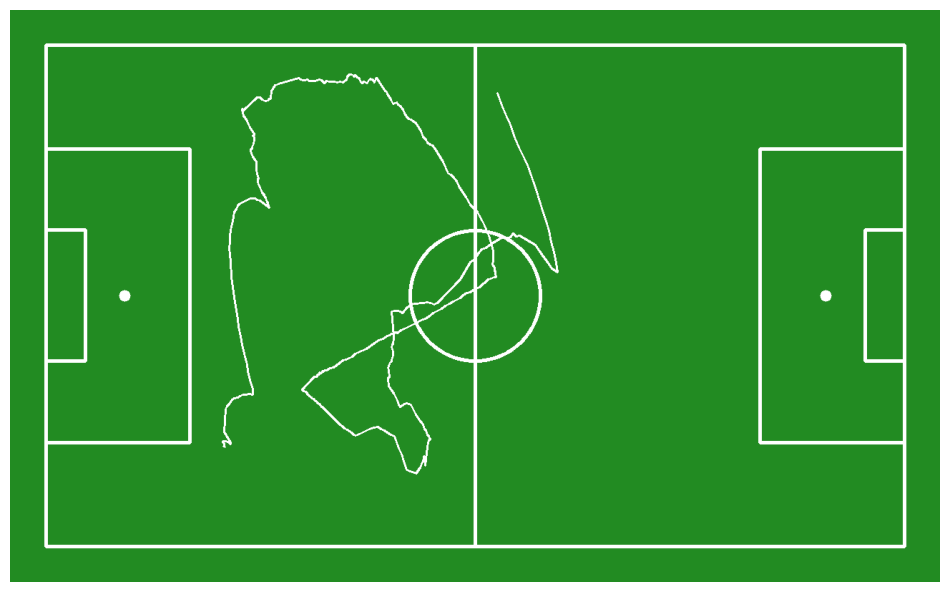

In [ ]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)